# Problem statement

# HOUSING: PRICE PREDICTION
Problem Statement:

Houses are one of the necessary need of each and every person around the globe and therefore housing and real estate market is one of the markets which is one of the major contributors in the world’s economy. It is a very large market and there are various companies working in the domain. Data science comes as a very important tool to solve problems in the domain to help the companies increase their overall revenue, profits, improving their marketing strategies and focusing on changing trends in house sales and purchases. Predictive modelling, Market mix modelling, recommendation systems are some of the machine learning techniques used for achieving the business goals for housing companies. Our problem is related to one such housing company.

A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses data analytics to purchase houses at a price below their actual values and flip them at a higher price. For the same purpose, the company has collected a data set from the sale of houses in Australia. The data is provided in the CSV file below.

The company is looking at prospective properties to buy houses to enter the market. You are required to build a model using Machine Learning in order to predict the actual value of the prospective properties and decide whether to invest in them or not. For this company wants to know: • Which variables are important to predict the price of variable? • How do these variables describe the price of the house?

Business Goal:

You are required to model the price of houses with the available independent variables. This model will then be used by the management to understand how exactly the prices vary with the variables. They can accordingly manipulate the strategy of the firm and concentrate on areas that will yield high returns. Further, the model will be a good way for the management to understand the pricing dynamics of a new market.

Technical Requirements:

• Data contains 1460 entries each having 81 variables.

• Data contains Null values. You need to treat them using the domain knowledge and your own understanding.

• Extensive EDA has to be performed to gain relationships of important variable and price.

• Data contains numerical as well as categorical variable. You need to handle them accordingly.

• You have to build Machine Learning models, apply regularization and determine the optimal values of Hyper Parameters.

• You need to find important features which affect the price positively or negatively.

• Two datasets are being provided to you (test.csv, train.csv). You will train on train.csv dataset and predict on test.csv file.

The “Data file.csv” and “Data description.txt” are enclosed with this file

# Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')

# To get the complete datasets without any spaces in rows and columns

In [2]:
pd.set_option('display.max_rows',None)

In [3]:
pd.set_option('display.max_columns',None)

# Getting the training dataset

In [4]:
df=pd.read_csv('Housing_price_train.csv')
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000


# EDA

In [5]:
df.shape

(1168, 81)

In [6]:
df.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [7]:
df.isnull().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       214
LotArea             0
Street              0
Alley            1091
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          7
MasVnrArea          7
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           30
BsmtCond           30
BsmtExposure       31
BsmtFinType1       30
BsmtFinSF1          0
BsmtFinType2       31
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          0
1stFlrSF            0
2ndFlrSF            0
LowQualFin

In [8]:
df.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating           object


In [9]:
df['Id'].duplicated().sum()

0

In [10]:
df['MSSubClass'].duplicated().sum()

1153

In [11]:
df['MSZoning'].duplicated().sum()

1163

In [12]:
df['LotFrontage'].duplicated().sum()

1061

In [13]:
df['LotArea'].duplicated().sum()

276

In [14]:
df['Street'].duplicated().sum()

1166

# Removing duplicate datas in this dataset

In [15]:
df.drop_duplicates()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000
5,1197,60,RL,58.0,14054,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,7,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,879,879,GasA,Ex,Y,SBrkr,879,984,0,1863,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2006.0,Fin,3,660,TA,TA,Y,100,17,0,0,0,0,NaN,NaN,NaN,0,11,2006,New,Partial,219210
6,561,20,RL,NaN,11341,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,6,1957,1996,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,180.0,TA,TA,CBlock,Gd,TA,No,ALQ,1302,Unf,0,90,1392,GasA,TA,Y,SBrkr,1392,0,0,1392,1,0,1,1,3,1,TA,5,Mod,1,Gd,Detchd,1957.0,Unf,2,528,TA,TA,Y,0,0,0,0,95,0,NaN,NaN,NaN,0,5,2010,WD,Normal,121500
7,1041,20,RL,88.0,13125,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,4,1957,2000,Gable,CompShg,Wd Sdng,Wd Sdng,BrkCmn,67.0,TA,TA,CBlock,TA,TA,No,Rec,168,BLQ,682,284,1134,GasA,Ex,Y,SBrkr,1803,0,0,1803,1,0,2,0,3,1,TA,8,Maj1,1,TA,Attchd,1957.0,RFn,2,484,TA,TA,Y,0,0,0,0,0,0,NaN,GdPrv,NaN,0,1,2006,WD,Normal,155000
8,503,20,RL,70.0,9170,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,Edwards,Feedr,Norm,1Fam,1Story,5,7,1965,1965,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,ALQ,698,GLQ,96,420,1214,GasA,Ex,Y,SBrkr,1214,0,0,1214,1,0,1,0,2,1,TA,6,Typ,0,NaN,Detchd,1965.0,Unf,2,461,Fa,Fa,Y,0,0,184,0,0,0,NaN,GdPrv,Shed,400,4,2007,WD,Normal,140000
9,576,50,RL,80.0,8480,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1.5Fin,5,5,1947,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,442,Unf,0,390,832,Gas

# Data Visualizations

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns

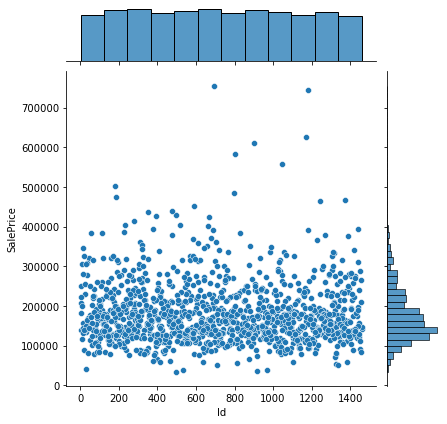

In [17]:
sns.jointplot(df['Id'],df['SalePrice'])

Comparing the column Id with the target variable Saleprice

<AxesSubplot:xlabel='MSSubClass', ylabel='SalePrice'>

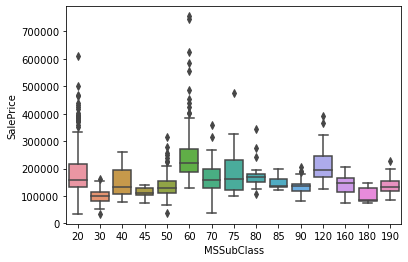

In [18]:
sns.boxplot(data=df,x='MSSubClass',y='SalePrice')

Comparing the column MSSubclass with the target variable Saleprice

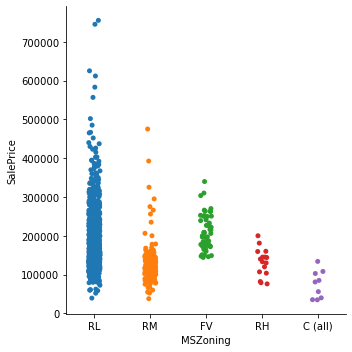

In [19]:
sns.catplot(data=df,x='MSZoning',y='SalePrice')

Comparing the column MSZoning with the target variable Saleprice

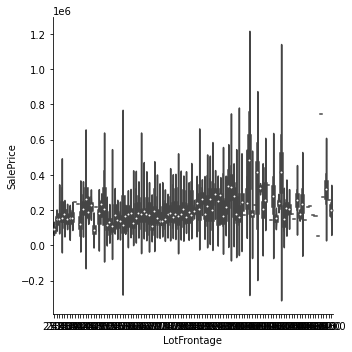

In [20]:
sns.catplot(data=df,x='LotFrontage',y='SalePrice',kind='violin')

Comparing the column LotFrontage with the target variable Saleprice

<AxesSubplot:xlabel='LotArea', ylabel='SalePrice'>

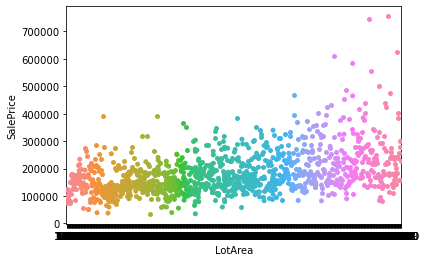

In [21]:
sns.swarmplot(data=df,x='LotArea',y='SalePrice')

Comparing the column LotArea with the target variable Saleprice

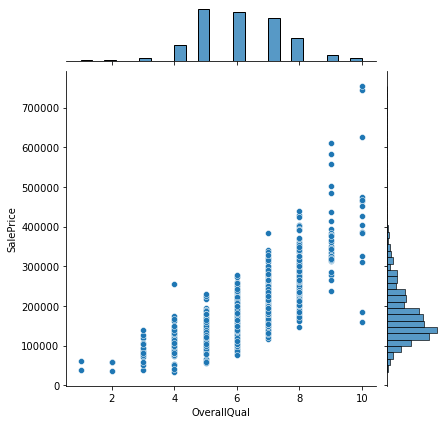

In [22]:
sns.jointplot(data=df,x='OverallQual',y='SalePrice')

Comparing the column OverallQual with the target variable Saleprice

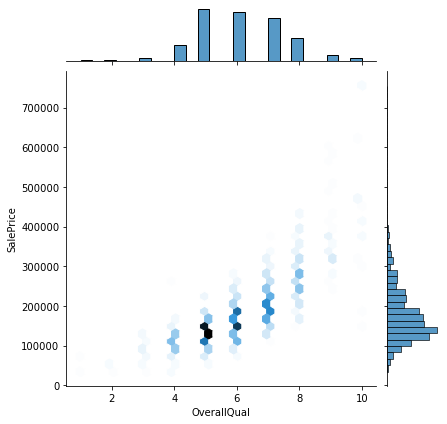

In [23]:
sns.jointplot(data=df,x='OverallQual',y='SalePrice',kind='hex')

Comparing  the column OverallQual with the target variable Saleprice with hexagon kind.

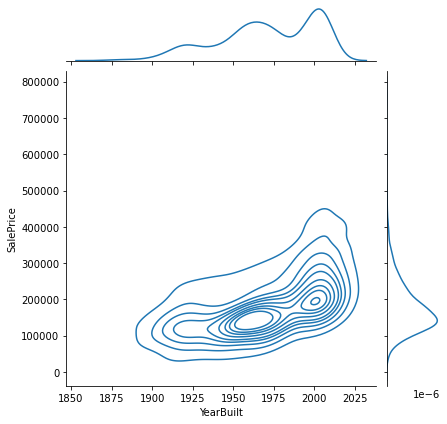

In [24]:
sns.jointplot(data=df,x='YearBuilt',y='SalePrice',kind='kde')

Comparing column YearBuilt  with the target variable Saleprice with kde kind of plot 

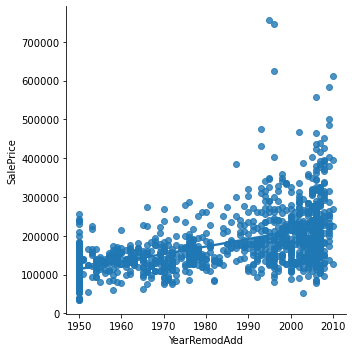

In [25]:
sns.lmplot(data=df,x='YearRemodAdd',y='SalePrice')

Comparing the column YearRemodAdd with the target variable Saleprice

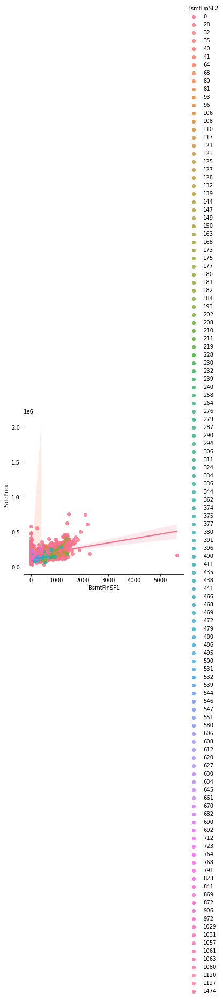

In [26]:
sns.lmplot(data=df,x='BsmtFinSF1',y='SalePrice',hue='BsmtFinSF2')

Comparing the columns BsmtFinSF1 and BsmtFinSF2 with the target variable Saleprice

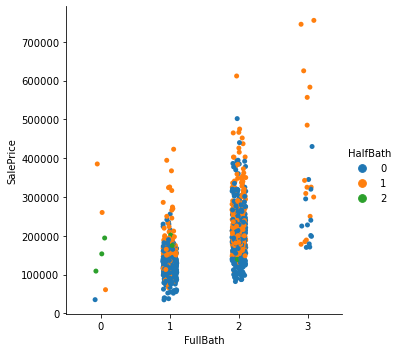

In [27]:
sns.catplot(data=df,x='FullBath',y='SalePrice',hue='HalfBath')

Comparing the columns FullBath and HalfBath with the target variable Saleprice

<AxesSubplot:xlabel='BedroomAbvGr', ylabel='SalePrice'>

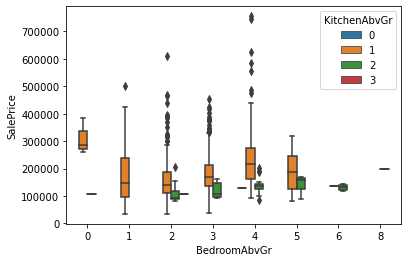

In [29]:
sns.boxplot(data=df,x='BedroomAbvGr',y='SalePrice',hue='KitchenAbvGr')

Comparing the columns BedroomAbvGr and KitchenAbvGr with the target variable Saleprice

<AxesSubplot:xlabel='Fireplaces', ylabel='SalePrice'>

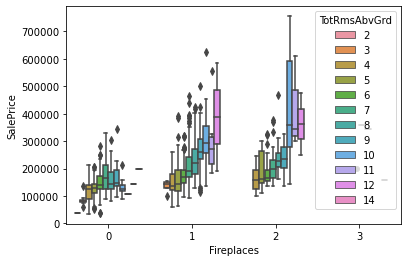

In [30]:
sns.boxplot(data=df,x='Fireplaces',y='SalePrice',hue='TotRmsAbvGrd')

Comparing the columns Fireplaces and TotRmsAbvGrd with the target variable Saleprice

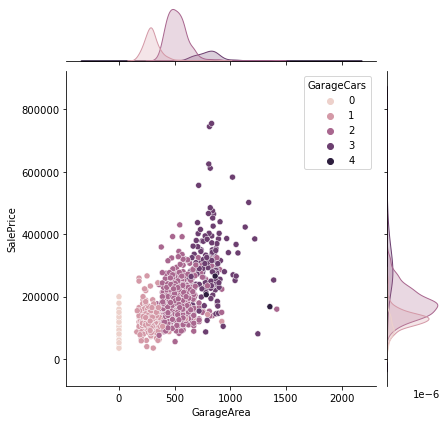

In [31]:
sns.jointplot(data=df,x='GarageArea',y='SalePrice',hue='GarageCars')

Comparing the columns GarageArea and GarageCars with the target variable Saleprice

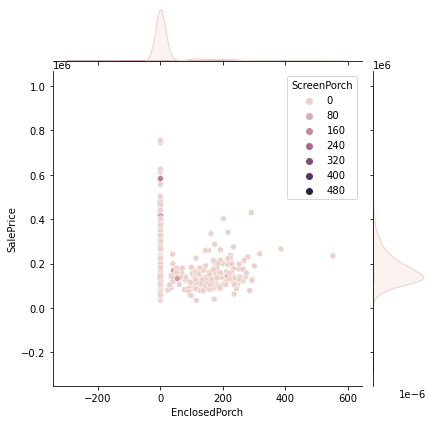

In [32]:
sns.jointplot(data=df,x='EnclosedPorch',y='SalePrice',hue='ScreenPorch')

Comparing the columns EnclosedPorch and ScreenPorch with the target variable Saleprice

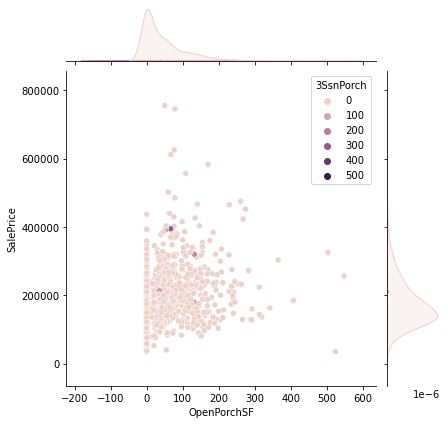

In [33]:
sns.jointplot(data=df,x='OpenPorchSF',y='SalePrice',hue='3SsnPorch')

Comparing the columns OpenPorchSF and 3SsnPorch with the target variable Saleprice

<AxesSubplot:xlabel='MiscVal', ylabel='SalePrice'>

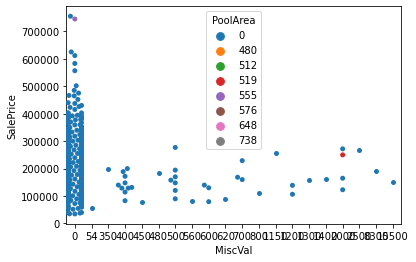

In [34]:
sns.swarmplot(data=df,x='MiscVal',y='SalePrice',hue='PoolArea')

Comparing the columns MiscVal and PoolArea with the target variable Saleprice

<AxesSubplot:xlabel='MoSold', ylabel='SalePrice'>

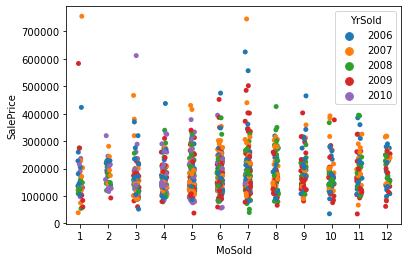

In [35]:
sns.stripplot(data=df,x='MoSold',y='SalePrice',hue='YrSold')

Comparing the columns MoSold and YrSold with the target variable Saleprice

<AxesSubplot:xlabel='SalePrice', ylabel='count'>

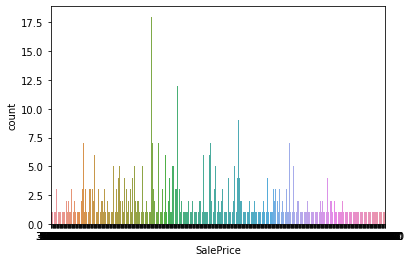

In [36]:
sns.countplot(df['SalePrice'])

Finally the Target Variable

# Getting the test dataset

In [37]:
df1=pd.read_csv('Housing_price_test.csv')
df1.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,2005,2006,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249,Unf,0,673,1922,GasA,Ex,Y,SBrkr,1922,0,0,1922,1,0,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,2005.0,Fin,3,676,TA,TA,Y,178,51,0,0,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036,Unf,0,184,1220,GasA,Gd,Y,SBrkr,1360,0,0,1360,1,0,1,0,1,1,Gd,4,Typ,1,Ex,Attchd,1984.0,RFn,2,565,TA,TA,Y,63,0,0,0,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8,5,2001,2001,Hip,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,1753,1753,GasA,Ex,Y,SBrkr,1788,0,0,1788,0,0,2,0,3,1,Ex,7,Typ,1,TA,Attchd,2001.0,RFn,2,522,TA,TA,Y,202,151,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,7,1941,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,275,Unf,0,429,704,GasA,Ex,Y,SBrkr,860,704,0,1564,0,0,1,1,3,1,Fa,7,Typ,1,Gd,Attchd,1941.0,Unf,1,234,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Somerst,Feedr,Norm,1Fam,2Story,6,5,2007,2007,Gable,CompShg,VinylSd,VinylSd,Stone,74.0,Gd,TA,PConc,Gd,TA,Mn,Unf,0,Unf,0,894,894,GasA,Ex,Y,SBrkr,894,1039,0,1933,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2007.0,Fin,3,668,TA,TA,Y,100,18,0,0,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal


# EDA

In [38]:
df1.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [39]:
df1.shape

(292, 80)

In [40]:
df1.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating           object


In [41]:
df1.isnull().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage       45
LotArea            0
Street             0
Alley            278
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         1
MasVnrArea         1
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual           7
BsmtCond           7
BsmtExposure       7
BsmtFinType1       7
BsmtFinSF1         0
BsmtFinType2       7
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         1
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath 

# Merging both train and test datasets to get the full data 

In [42]:
df_merged=pd.concat([df,df1],ignore_index=True,sort=False)
df_merged.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000.0
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000.0
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790.0
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000.0
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000.0


# EDA

In [44]:
df_merged.shape

(1460, 81)

In [45]:
df_merged.isnull().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       259
LotArea             0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          8
MasVnrArea          8
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           37
BsmtCond           37
BsmtExposure       38
BsmtFinType1       37
BsmtFinSF1          0
BsmtFinType2       38
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFin

# Dropping few columns as it has more than 3/4 th of null values which may affect the prediction

In [46]:
df_merged.drop(['Alley','PoolQC','Fence','MiscFeature'],axis=1,inplace=True)

# Getting the dataset after dropping

In [47]:
df_merged.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,0,2,2007,WD,Normal,128000.0
1,889,20,RL,95.0,15865,Pave,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,0,10,2007,WD,Normal,268000.0
2,793,60,RL,92.0,9920,Pave,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,0,6,2007,WD,Normal,269790.0
3,110,20,RL,105.0,11751,Pave,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,0,1,2010,COD,Normal,190000.0
4,422,20,RL,NaN,16635,Pave,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,0,6,2009,WD,Normal,215000.0


In [48]:
df_merged.shape

(1460, 77)

# Converting all object datas into int or float data for better processing

In [49]:
import sklearn 
from sklearn.preprocessing import OrdinalEncoder
ordin=OrdinalEncoder()
ordin.fit(df_merged)

OrdinalEncoder()

In [50]:
for i in df_merged.columns:
    if df_merged[i].dtypes=='object':
        df_merged[i]=ordin.fit_transform(df_merged[i].values.reshape(-1,1))

In [51]:
df_merged.dtypes

Id                 int64
MSSubClass         int64
MSZoning         float64
LotFrontage      float64
LotArea            int64
Street           float64
LotShape         float64
LandContour      float64
Utilities        float64
LotConfig        float64
LandSlope        float64
Neighborhood     float64
Condition1       float64
Condition2       float64
BldgType         float64
HouseStyle       float64
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle        float64
RoofMatl         float64
Exterior1st      float64
Exterior2nd      float64
MasVnrType       float64
MasVnrArea       float64
ExterQual        float64
ExterCond        float64
Foundation       float64
BsmtQual         float64
BsmtCond         float64
BsmtExposure     float64
BsmtFinType1     float64
BsmtFinSF1         int64
BsmtFinType2     float64
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating          float64
HeatingQC        float64


# Converting all null datas

In [52]:
df_merged.isnull().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
Street             0
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         8
MasVnrArea         8
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinSF1         0
BsmtFinType2      38
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         1
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath       0
BsmtHalfBath 

In [53]:
for i in df_merged.columns:
    df_merged[i].fillna(np.mean(df_merged[i]),inplace=True)    

In [54]:
df_merged.isnull().sum()

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual 

# Drpping duplicate datas

In [55]:
df_merged.drop_duplicates()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,3.0,70.049958,4928,1.0,0.0,3.0,0.0,4.0,0.0,13.0,2.0,2.0,4.0,2.0,6,5,1976,1976,1.0,1.0,9.0,10.0,2.000000,0.000000,3.0,4.0,1.0,2.00000,3.000000,3.00000,0.000000,120,5.000000,0,958,1078,1.0,4.0,1.0,4.000000,958,0,0,958,0,0,2,0,2,1,3.0,5,6.0,1,4.000000,1.000000,1977.000000,1.000000,2,440,4.000000,4.000000,2.0,0,205,0,0,0,0,0,2,2007,8.0,4.0,128000.000000
1,889,20,3.0,95.000000,15865,1.0,0.0,3.0,0.0,4.0,1.0,12.0,2.0,2.0,0.0,2.0,8,6,1970,1970,0.0,5.0,13.0,14.0,2.000000,0.000000,2.0,2.0,2.0,3.00000,1.000000,1.00000,0.000000,351,4.000000,823,1043,2217,1.0,0.0,1.0,4.000000,2217,0,0,2217,1,0,2,0,4,1,2.0,8,6.0,1,4.000000,1.000000,1970.000000,2.000000,2,621,4.000000,4.000000,2.0,81,207,0,0,224,0,0,10,2007,8.0,4.0,268000.000000
2,793,60,3.0,92.000000,9920,1.0,0.0,3.0,0.0,1.0,0.0,15.0,2.0,2.0,0.0,5.0,7,5,1996,1997,1.0,1.0,8.0,8.0,2.000000,0.000000,2.0,4.0,2.0,2.00000,3.000000,0.00000,2.000000,862,5.000000,0,255,1117,1.0,0.0,1.0,4.000000,1127,886,0,2013,1,0,2,1,3,1,3.0,8,6.0,1,4.000000,1.000000,1997.000000,2.000000,2,455,4.000000,4.000000,2.0,180,130,0,0,0,0,0,6,2007,8.0,4.0,269790.000000
3,110,20,3.0,105.000000,11751,1.0,0.0,3.0,0.0,4.0,0.0,14.0,2.0,2.0,0.0,2.0,6,6,1977,1977,3.0,1.0,9.0,10.0,1.000000,480.000000,3.0,4.0,1.0,2.00000,3.000000,3.00000,1.000000,705,5.000000,0,1139,1844,1.0,0.0,1.0,4.000000,1844,0,0,1844,0,0,2,0,3,1,3.0,7,6.0,1,4.000000,1.000000,1977.000000,1.000000,2,546,4.000000,4.000000,2.0,0,122,0,0,0,0,0,1,2010,0.0,4.0,190000.000000
4,422,20,3.0,70.049958,16635,1.0,0.0,3.0,0.0,2.0,0.0,14.0,2.0,2.0,0.0,2.0,6,7,1977,2000,1.0,1.0,5.0,5.0,3.000000,126.000000,2.0,4.0,1.0,2.00000,3.000000,3.00000,0.000000,1246,5.000000,0,356,1602,1.0,2.0,1.0,4.000000,1602,0,0,1602,0,1,2,0,3,1,2.0,8,6.0,1,4.000000,1.000000,1977.000000,0.000000,2,529,4.000000,4.000000,2.0,240,0,0,0,0,0,0,6,2009,8.0,4.0,215000.000000
5,1197,60,3.0,58.000000,14054,1.0,0.0,3.0,0.0,4.0,0.0,8.0,2.0,2.0,0.0,5.0,7,5,2006,2006,1.0,1.0,12.0,13.0,2.000000,0.000000,2.0,4.0,2.0,2.00000,3.000000,0.00000,5.000000,0,5.000000,0,879,879,1.0,0.0,1.0,4.000000,879,984,0,1863,0,0,2,1,4,1,2.0,9,6.0,1,2.000000,3.000000,2006.000000,0.000000,3,660,4.000000,4.000000,2.0,100,17,0,0,0,0,0,11,2006,6.0,5.0,219210.000000
6,561,20,3.0,70.049958,11341,1.0,0.0,3.0,0.0,4.0,0.0,19.0,2.0,2.0,0.0,2.0,5,6,1957,1996,3.0,1.0,13.0,14.0,1.000000,180.000000,3.0,4.0,1.0,2.00000,3.000000,3.00000,0.000000,1302,5.000000,0,90,1392,1.0,4.0,1.0,4.000000,1392,0,0,1392,1,0,1,1,3,1,3.0,5,4.0,1,2.000000,5.000000,1957.000000,2.000000,2,528,4.000000,4.000000,2.0,0,0,0,0,95,0,0,5,2010,8.0,4.0,121500.000000
7,1041,20,3.0,88.000000,13125,1.0,3.0,3.0,0.0,0.0,0.0,19.0,2.0,2.0,0.0,2.0,5,4,1957,2000,1.0,1.0,13.0,14.0,0.000000,67.000000,3.0,4.0,1.0,3.00000,3.000000,3.00000,4.000000,168,1.000000,682,284,1134,1.0,0.0,1.0,4.000000,1803,0,0,1803,1,0,2,0,3,1,3.0,8,0.0,1,4.000000,1.000000,1957.000000,1.000000,2,484,4.000000,4.000000,2.0,0,0,0,0,0,0,0,1,2006,8.0,4.0,155000.000000
8,503,20,3.0,70.000000,9170,1.0,3.0,3.0,0.0,0.0,0.0,7.0,1.0,2.0,0.0,2.0,5,7,1965,1965,3.0,1.0,8.0,8.0,2.000000,0.000000,3.0,4.0,1.0,3.00000,3.000000,3.00000,0.000000,698,2.000000,96,420,1214,1.0,0.0,1.0,4.000000,1214,0,0,1214,1,0,1,0,2,1,3.0,6

# DATA CLEANSING

In [56]:
df_merged.shape

(1460, 77)

In [57]:
df_merged.describe()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.00000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,3.028767,70.049958,10516.828082,0.995890,1.942466,2.777397,0.000685,3.019178,0.062329,12.251370,2.031507,2.008219,0.493151,3.038356,6.099315,5.575342,1971.267808,1984.865753,1.410274,1.075342,9.624658,10.339726,1.761019,103.685262,2.539726,3.733562,1.396575,2.261420,2.812368,2.26512,2.732256,443.639726,4.708158,46.549315,567.240411,1057.429452,1.036301,1.538356,0.934932,3.681974,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,2.339726,6.517808,5.749315,0.613014,2.733766,2.279188,1978.506164,1.183466,1.767123,472.980137,3.864394,3.899927,1.856164,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,7.513014,3.770548,181477.005993
std,421.610009,42.300571,0.632017,22.024023,9981.264932,0.063996,1.409156,0.707666,0.026171,1.622634,0.276232,6.013735,0.868515,0.259040,1.198277,1.911305,1.382997,1.112799,30.202904,20.645407,0.834998,0.599127,3.197659,3.540570,0.614020,180.569112,0.693995,0.731807,0.722394,0.856676,0.650250,1.13244,1.802631,456.098091,0.924084,161.319273,441.866955,438.705324,0.295124,1.739524,0.246731,1.051268,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,0.830161,1.625393,0.979659,0.644666,0.822250,1.735315,23.994583,0.790009,0.747315,213.804841,0.593338,0.507780,0.496592,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,1.552100,1.100854,70748.125717
min,1.000000,20.000000,0.000000,21.000000,1300.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,0.000000,0.000000,34900.000000
25%,365.750000,20.000000,3.000000,60.0

In [58]:
df_merged.corr()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
Id,1.000000,0.011156,-0.006096,-9.600822e-03,-0.033226,0.008916,0.032122,-0.019659,1.332409e-02,0.049756,0.005847,-0.013735,-0.003815,0.001839,0.021912,0.018111,-0.028365,0.012609,-0.012713,-0.021998,0.038675,-0.022562,-0.034694,-0.042847,0.051369,-0.050199,0.001689,0.029826,0.008514,0.052138,0.006970,-0.024522,0.015356,-0.005024,0.045641,-0.005968,-0.007940,-0.015415,0.042120,0.002157,0.009821,0.037314,0.010496,0.005590,-0.044230,0.008273,0.002289,-0.020155,0.005587,0.006784,0.037719,0.002951,-0.004432,0.027239,-0.001064,-0.019772,0.006999,-0.002082,0.000070,-0.008508,0.016570,0.017634,-0.002528,-0.017434,0.005971,-0.029643,-0.000477,0.002889,-0.046635,0.001330,0.057044,-0.006242,0.021172,0.000712,0.019773,-0.005806,-2.109619e-02
MSSubClass,0.011156,1.000000,0.035900,-3.570559e-01,-0.139781,-0.024969,0.119289,-0.002940,-2.284384e-02,0.075910,-0.025672,-0.005985,-0.024762,-0.042395,0.746063,0.397161,0.032628,-0.059316,0.027850,0.040581,-0.117817,-0.031336,-0.089159,-0.137229,-0.029389,0.022895,-0.017161,-0.003254,0.058126,-0.043533,-0.014366,-0.066171,0.013867,-0.069836,0.040669,-0.065649,-0.140759,-0.238518,0.048009,0.020760,-0.101774,0.051833,-0.251758,0.307886,0.046474,0.074853,0.003491,-0.002333,0.131608,0.177354,-0.023438,0.281721,0.010129,0.040380,0.003711,-0.045569,0.051810,0.106411,0.080187,-0.007562,-0.040110,-0.098672,0.003173,-0.000922,-0.059925,-0.012579,-0.006100,-0.012037,-0.043825,-0.026030,0.008283,-0.007683,-0.013585,-0.021407,0.012464,-0.024940,-5.389151e-02
MSZoning,-0.006096,0.035900,1.000000,-1.063635e-01,-0.034452,0.087654,0.061887,-0.017854,-1.192034e-03,-0.009895,-0.022055,-0.249679,-0.027874,0.044606,0.005690,-0.105315,-0.160099,0.186951,-0.308908,-0.174728,-0.000301,0.005133,-0.008558,0.006963,-0.025661,-0.066766,0.200536,-0.096041,-0.235174,0.127608,-0.011145,0.036065,0.022525,-0.049128,-0.032411,0.028086,-0.046749,-0.087834,0.056866,0.134279,-0.049523,-0.070811,-0.055614,-0.051481,0.011520,-0.082615,-0.018526,0.007193,-0.198290,-0.133876,-0.016471,0.049434,0.128976,-0.043200,-0.095722,-0.011349,-0.001062,0.127776,-0.264654,0.157927,-0.157042,-0.189250,-0.154149,-0.086064,-0.100366,-0.009477,-0.154704,0.115509,0.000362,0.019089,-0.003128,0.009293,-0.031496,-0.020628,0.097437,0.009494,-1.193541e-01
LotFrontage,-0.009601,-0.357056,-0.106363,1.000000e+00,0.306795,-0.037323,-0.144931,-0.075647,-8.360070e-17,-0.181253,0.067608,0.084545,-0.008483,0.003214,-0.408564,0.031907,0.234196,-0.052820,0.117598,0.082746,0.153467,0.082026,0.074448,0.098756,-0.020515,0.179283,-0.183293,0.047951,0.098809,-0.166136,0.052849,-0.121848,-0.020219,0.215828,-0.025575,0.043340,0.122156,0.363358,-0.020815,-0.079975,0.068666,0.060187,0.414266,0.072483,0.036849,0.368392,0.091481,-0.006419,0.180424,0.048258,0.237023,-0.005805,-0.189082,0.320146,0.030250,0.235755,-0.030718,-0.237246,0.064324,-0.194958,0.269729,0.323663,0.056254,0.047585,0.089073,0.077106,0.137454,0.009790,0.062335,0.037684,0.180868,0.001168,0.010158,0.006768,-0.030846,0.058464,2.951056e-01
LotArea,-0.033226,-0.139781,-0.034452,3.067946e-01,1.000000,-0.197131,-0.165315,-0.149083,1.012318e-02,-0.121161,0.436868,0.044569,0.023846,0.022164,-0.205721,-0.033190

In [59]:
plt.figure(figsize=(150,150))
sns.heatmap(df_merged.corr(),annot=True)
plt.show()

In [60]:
df_merged.skew()

Id                0.000000
MSSubClass        1.407657
MSZoning         -1.735395
LotFrontage       2.384950
LotArea          12.207688
Street          -15.518770
LotShape         -0.610175
LandContour      -3.162499
Utilities        38.209946
LotConfig        -1.135632
LandSlope         4.813682
Neighborhood      0.042122
Condition1        3.019196
Condition2       13.171844
BldgType          2.245648
HouseStyle        0.306755
OverallQual       0.216944
OverallCond       0.693067
YearBuilt        -0.613461
YearRemodAdd     -0.503562
RoofStyle         1.473796
RoofMatl          8.109402
Exterior1st      -0.726314
Exterior2nd      -0.692963
MasVnrType       -0.067630
MasVnrArea        2.676412
ExterQual        -1.830265
ExterCond        -2.565305
Foundation        0.091217
BsmtQual         -1.330925
BsmtCond         -3.445777
BsmtExposure     -1.164326
BsmtFinType1     -0.015651
BsmtFinSF1        1.685503
BsmtFinType2     -3.618992
BsmtFinSF2        4.255261
BsmtUnfSF         0.920268
T

# Removing outliers

In [61]:
import sklearn
from scipy.stats import zscore
z=np.abs(zscore(df_merged))

In [62]:
dfnew=df_merged[(z<3).all(axis=1)]
dfnew.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,3.0,70.049958,4928,1.0,0.0,3.0,0.0,4.0,0.0,13.0,2.0,2.0,4.0,2.0,6,5,1976,1976,1.0,1.0,9.0,10.0,2.0,0.0,3.0,4.0,1.0,2.0,3.0,3.0,0.0,120,5.0,0,958,1078,1.0,4.0,1.0,4.0,958,0,0,958,0,0,2,0,2,1,3.0,5,6.0,1,4.0,1.0,1977.0,1.0,2,440,4.0,4.0,2.0,0,205,0,0,0,0,0,2,2007,8.0,4.0,128000.0
2,793,60,3.0,92.000000,9920,1.0,0.0,3.0,0.0,1.0,0.0,15.0,2.0,2.0,0.0,5.0,7,5,1996,1997,1.0,1.0,8.0,8.0,2.0,0.0,2.0,4.0,2.0,2.0,3.0,0.0,2.0,862,5.0,0,255,1117,1.0,0.0,1.0,4.0,1127,886,0,2013,1,0,2,1,3,1,3.0,8,6.0,1,4.0,1.0,1997.0,2.0,2,455,4.0,4.0,2.0,180,130,0,0,0,0,0,6,2007,8.0,4.0,269790.0
5,1197,60,3.0,58.000000,14054,1.0,0.0,3.0,0.0,4.0,0.0,8.0,2.0,2.0,0.0,5.0,7,5,2006,2006,1.0,1.0,12.0,13.0,2.0,0.0,2.0,4.0,2.0,2.0,3.0,0.0,5.0,0,5.0,0,879,879,1.0,0.0,1.0,4.0,879,984,0,1863,0,0,2,1,4,1,2.0,9,6.0,1,2.0,3.0,2006.0,0.0,3,660,4.0,4.0,2.0,100,17,0,0,0,0,0,11,2006,6.0,5.0,219210.0
6,561,20,3.0,70.049958,11341,1.0,0.0,3.0,0.0,4.0,0.0,19.0,2.0,2.0,0.0,2.0,5,6,1957,1996,3.0,1.0,13.0,14.0,1.0,180.0,3.0,4.0,1.0,2.0,3.0,3.0,0.0,1302,5.0,0,90,1392,1.0,4.0,1.0,4.0,1392,0,0,1392,1,0,1,1,3,1,3.0,5,4.0,1,2.0,5.0,1957.0,2.0,2,528,4.0,4.0,2.0,0,0,0,0,95,0,0,5,2010,8.0,4.0,121500.0
11,833,60,3.0,44.000000,9548,1.0,0.0,3.0,0.0,1.0,0.0,5.0,2.0,2.0,0.0,5.0,7,6,2003,2003,1.0,1.0,12.0,13.0,1.0,223.0,2.0,4.0,2.0,2.0,3.0,3.0,2.0,483,5.0,0,458,941,1.0,0.0,1.0,4.0,941,888,0,1829,1,0,2,1,3,1,2.0,7,6.0,1,4.0,1.0,2003.0,1.0,2,613,4.0,4.0,2.0,192,39,0,0,0,0,0,1,2010,8.0,4.0,237000.0


Outliers removed

# Final dataset for splitting

In [63]:
dfnew.shape

(603, 77)

# Splitting x variable and y variable

In [64]:
x=dfnew.iloc[:,0:-1]
y=dfnew['SalePrice']

In [65]:
x.shape

(603, 76)

In [66]:
y.shape

(603,)

# Traing and Testing 

In [67]:
from sklearn.model_selection import train_test_split

# Since the target variable (y) contains more of float data, we consider Regression for prediction

In [68]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error

In [69]:
lr=LinearRegression()

# Getting the accurate random_state 

In [70]:
maxAcc=0
maxRS=0
for i in range(0,1000):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=i)
    lr.fit(x_train,y_train)
    predlr=lr.predict(x_test)
    score=r2_score(y_test,predlr)
    print('R2_score of LinearRegression ' ,score, 'at random_state ' ,i)
    if score > maxAcc:
        maxAcc=score
        maxRS=i
    print('Mac r2 score of lr ' ,maxAcc*100, 'at random_state ' ,maxRS) 

R2_score of LinearRegression  0.7051133997159826 at random_state  0
Mac r2 score of lr  70.51133997159826 at random_state  0
R2_score of LinearRegression  0.6839817715936088 at random_state  1
Mac r2 score of lr  70.51133997159826 at random_state  0
R2_score of LinearRegression  0.6200562106161887 at random_state  2
Mac r2 score of lr  70.51133997159826 at random_state  0
R2_score of LinearRegression  0.6863181981228903 at random_state  3
Mac r2 score of lr  70.51133997159826 at random_state  0
R2_score of LinearRegression  0.7187778842174373 at random_state  4
Mac r2 score of lr  71.87778842174373 at random_state  4
R2_score of LinearRegression  0.5894127996600544 at random_state  5
Mac r2 score of lr  71.87778842174373 at random_state  4
R2_score of LinearRegression  0.7147861444008787 at random_state  6
Mac r2 score of lr  71.87778842174373 at random_state  4
R2_score of LinearRegression  0.6178872581569359 at random_state  7
Mac r2 score of lr  71.87778842174373 at random_state  4


In [71]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=830)
lr.fit(x_train,y_train)
predlr=lr.predict(x_test)
print('Accuracy_score of LinearRegression is : ' ,r2_score(y_test,predlr)*100)

Accuracy_score of LinearRegression is :  79.58791786708042


# Regularisation

In [72]:
from sklearn.linear_model import Lasso,Ridge,ElasticNet
l=Lasso()
r=Ridge()
en=ElasticNet()

In [73]:
m=[l,r,en]
for i in m:
    i.fit(x_train,y_train)
    predi=i.predict(x_test)
    scorE=r2_score(y_test,predi)
    print('R2_score of model ' ,i, scorE*100)

R2_score of model  Lasso() 79.60870588513613
R2_score of model  Ridge() 80.0491666720944
R2_score of model  ElasticNet() 79.28370655729428


# Trying with different alpha parameter

In [74]:
mod=[l,r,en]
for i in mod:
    alpha=[0.0001,0.001,0.01,0.1,1]
    for j in alpha:
        predmod=i.predict(x_test)
        print('R2_score: ' ,(r2_score(y_test,predmod))*100 ,'at model: ' ,i ,'with alpha: ' ,j)

R2_score:  79.60870588513613 at model:  Lasso() with alpha:  0.0001
R2_score:  79.60870588513613 at model:  Lasso() with alpha:  0.001
R2_score:  79.60870588513613 at model:  Lasso() with alpha:  0.01
R2_score:  79.60870588513613 at model:  Lasso() with alpha:  0.1
R2_score:  79.60870588513613 at model:  Lasso() with alpha:  1
R2_score:  80.0491666720944 at model:  Ridge() with alpha:  0.0001
R2_score:  80.0491666720944 at model:  Ridge() with alpha:  0.001
R2_score:  80.0491666720944 at model:  Ridge() with alpha:  0.01
R2_score:  80.0491666720944 at model:  Ridge() with alpha:  0.1
R2_score:  80.0491666720944 at model:  Ridge() with alpha:  1
R2_score:  79.28370655729428 at model:  ElasticNet() with alpha:  0.0001
R2_score:  79.28370655729428 at model:  ElasticNet() with alpha:  0.001
R2_score:  79.28370655729428 at model:  ElasticNet() with alpha:  0.01
R2_score:  79.28370655729428 at model:  ElasticNet() with alpha:  0.1
R2_score:  79.28370655729428 at model:  ElasticNet() with alp

# Testing with various models

In [75]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.ensemble import GradientBoostingRegressor,AdaBoostRegressor,ExtraTreesRegressor,RandomForestRegressor

In [76]:
dtr=DecisionTreeRegressor()
dtr.fit(x_train,y_train)
knr=KNeighborsRegressor()
knr.fit(x_train,y_train)
svr=SVR()
svr.fit(x_train,y_train)
gbr=GradientBoostingRegressor()
gbr.fit(x_train,y_train)
abr=AdaBoostRegressor()
abr.fit(x_train,y_train)
etr=ExtraTreesRegressor()
etr.fit(x_train,y_train)
rfr=RandomForestRegressor()
rfr.fit(x_train,y_train)

RandomForestRegressor()

In [77]:
models=[dtr,knr,svr,gbr,abr,etr,rfr]
for i in models:
    predi=i.predict(x_test)
    score=r2_score(y_test,predi)
    print('R2_score of model ' ,i, 'is equal == ' ,score*100)        

R2_score of model  DecisionTreeRegressor() is equal ==  49.00557419313938
R2_score of model  KNeighborsRegressor() is equal ==  57.77462181736257
R2_score of model  SVR() is equal ==  -0.4940049409957181
R2_score of model  GradientBoostingRegressor() is equal ==  77.08546472804959
R2_score of model  AdaBoostRegressor() is equal ==  73.5442907280182
R2_score of model  ExtraTreesRegressor() is equal ==  73.9296759049584
R2_score of model  RandomForestRegressor() is equal ==  78.22415754262695


# Hypertuning

In [78]:
from sklearn.model_selection import GridSearchCV

In [79]:
parameters={'criterion':['gini','squared_error'],
            'max_depth':[1,2,3],
            'max_features':['auto','sqrt','log2'],
            'random_state':[1,2,3]}
gscv=GridSearchCV(estimator=dtr,param_grid=parameters)
gscv.fit(x_train,y_train)

GridSearchCV(estimator=DecisionTreeRegressor(),
             param_grid={'criterion': ['gini', 'squared_error'],
                         'max_depth': [1, 2, 3],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'random_state': [1, 2, 3]})

In [80]:
preddtr=gscv.predict(x_test)
print('R2_SCORE OF DTR' ,r2_score(y_test,preddtr)*100)

R2_SCORE OF DTR 62.22768795048803


In [81]:
parameters={'n_neighbors':[1,2,3],
            'n_jobs':[1,2,3],
            'algorithm':['ball_tree', 'kd_tree', 'brute'],
            'p':[1,2,3]}
gscv=GridSearchCV(estimator=knr,param_grid=parameters)
gscv.fit(x_train,y_train)

GridSearchCV(estimator=KNeighborsRegressor(),
             param_grid={'algorithm': ['ball_tree', 'kd_tree', 'brute'],
                         'n_jobs': [1, 2, 3], 'n_neighbors': [1, 2, 3],
                         'p': [1, 2, 3]})

In [82]:
predknr=gscv.predict(x_test)
print('R2_SCORE OF KNeighbors' ,r2_score(y_test,predknr)*100)

R2_SCORE OF KNeighbors 59.282683813378156


In [83]:
parameters={'loss':['squared_error','absolute_error','huber','quantile'],
            'learning_rate':[0.0001,0.001,0.01,0.1],
            'n_estimators':[50,100,150,200],
            'criterion':['friedman_mse', 'squared_error']}
gscv=GridSearchCV(estimator=gbr,param_grid=parameters)
gscv.fit(x_train,y_train)

GridSearchCV(estimator=GradientBoostingRegressor(),
             param_grid={'criterion': ['friedman_mse', 'squared_error'],
                         'learning_rate': [0.0001, 0.001, 0.01, 0.1],
                         'loss': ['squared_error', 'absolute_error', 'huber',
                                  'quantile'],
                         'n_estimators': [50, 100, 150, 200]})

In [84]:
predgbr=gscv.predict(x_test)
print('R2_SCORE OF GradientBoosting' ,r2_score(y_test,predgbr)*100)

R2_SCORE OF GradientBoosting 77.36396507620177


In [85]:
parameters={'loss':['linear','square','exponential'],
            'learning_rate':[0.001,0.01,0.1],
            'n_estimators':[100,150,200],
            'random_state':[200,300,400]}
gscv=GridSearchCV(estimator=abr,param_grid=parameters)
gscv.fit(x_train,y_train)

GridSearchCV(estimator=AdaBoostRegressor(),
             param_grid={'learning_rate': [0.001, 0.01, 0.1],
                         'loss': ['linear', 'square', 'exponential'],
                         'n_estimators': [100, 150, 200],
                         'random_state': [200, 300, 400]})

In [86]:
predabr=gscv.predict(x_test)
print('R2_SCORE OF AdaBoost' ,r2_score(y_test,predabr)*100)

R2_SCORE OF AdaBoost 71.40403412941254


In [87]:
parameters={'n_estimators':[50,100,150,200],
            'criterion':['squared_error', 'absolute_error', 'friedman_mse', 'poisson'],
            'max_depth':[1,2,3,4],
            'max_features':['sqrt', 'log2', None]}
gscv=GridSearchCV(estimator=etr,param_grid=parameters)
gscv.fit(x_train,y_train)

GridSearchCV(estimator=ExtraTreesRegressor(),
             param_grid={'criterion': ['squared_error', 'absolute_error',
                                       'friedman_mse', 'poisson'],
                         'max_depth': [1, 2, 3, 4],
                         'max_features': ['sqrt', 'log2', None],
                         'n_estimators': [50, 100, 150, 200]})

In [88]:
predetr=gscv.predict(x_test)
print('R2_SCORE OF ExtraTrees' ,r2_score(y_test,predetr)*100)

R2_SCORE OF ExtraTrees 67.07578835401097


In [89]:
parameters={'n_estimators':[50,100,150,200],
            'criterion':['squared_error', 'absolute_error', 'friedman_mse', 'poisson'],
            'max_depth':[1,2,3,4],
            'max_features':['sqrt', 'log2', 1.0]}
gscv=GridSearchCV(estimator=rfr,param_grid=parameters)
gscv.fit(x_train,y_train)

GridSearchCV(estimator=RandomForestRegressor(),
             param_grid={'criterion': ['squared_error', 'absolute_error',
                                       'friedman_mse', 'poisson'],
                         'max_depth': [1, 2, 3, 4],
                         'max_features': ['sqrt', 'log2', 1.0],
                         'n_estimators': [50, 100, 150, 200]})

In [90]:
predrfr=gscv.predict(x_test)
print('R2_SCORE OF RandomForest' ,r2_score(y_test,predrfr)*100)

R2_SCORE OF RandomForest 68.90787511636178


# Compared to all models RIDGE model has the best r2_score, so hypertuning it  

In [91]:
parameters={'alpha':[0.1,1.0],
            'fit_intercept':[True,False],
            'copy_X':[True,False],
            'max_iter':[800,900]}
gscv=GridSearchCV(estimator=Ridge(),param_grid=parameters)
gscv.fit(x_train,y_train)

GridSearchCV(estimator=Ridge(),
             param_grid={'alpha': [0.1, 1.0], 'copy_X': [True, False],
                         'fit_intercept': [True, False],
                         'max_iter': [800, 900]})

In [92]:
predr=gscv.predict(x_test)
print('R2_SCORE OF Ridge' ,r2_score(y_test,predr)*100)

R2_SCORE OF Ridge 80.03871221680038


# Comparing the best two models in a dataframe

In [93]:
r=Ridge()
r.fit(x_train,y_train)

Ridge()

In [94]:
a=np.array(y_test)
 
rf=np.array(rfr.predict(x_test))
ri=np.array(r.predict(x_test))
g=np.array(gbr.predict(x_test))
df_trial=pd.DataFrame({'Actual_result':a,'RandomForest':rf,'Ridge':ri,'GradientBoost':g},index=range(len(a)))
df_trial.T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120
Actual_result,187100.000000,243000.000000,117000.000000,173000.000000,167000.000000,159895.000000,148000.000000,275500.000000,221000.000000,185000.000000,133500.000000,354000.000000,137500.000000,181477.005993,88000.000000,153900.000000,142500.000000,181477.005993,120500.000000,222500.000000,284000.00000,190000.000000,213500.000000,122000.000000,262000.000000,169000.000000,168500.000000,94750.000000,157900.000000,194000.000000,191000.000000,215000.000000,155000.000000,202500.000000,128500.000000,181477.005993,213490.000000,201000.000000,193500.000000,208500.000000,135000.000000,181477.005993,325000.000000,140000.000000,125000.000000,133000.000000,189950.000000,261500.000000,153000.000000,181134.000000,181477.005993,80000.000000,312500.000000,167500.000000,132500.000000,89500.000000,136500.000000,134500.000000,335000.000000,129000.000000,297000.000000,113000.000000,153900.000000,181477.005993,224000.000000,181477.005993,220000.000000,119000.000000,100000.000000,181477.005993,109500.000000,153500.000000,110000.000000,149500.000000,110000.000000,325624.000000,194700.000000,149000.000000,149900.000000,138000.000000,75500.000000,164000.000000,139000.000000,128000.000000,307000.000000,167000.000000,123000.000000,181477.005993,183000.000000,214000.000000,127000.000000,210000.000000,191000.000000,181477.005993,124500.000000,244600.000000,135000.000000,128950.000000,128000.000000,188000.000000,181477.005993,181477.005993,275000.000000,215000.000000,237000.000000,125000.000000,176000.000000,181477.005993,183500.000000,221500.000000,179200.000000,181477.005993,134500.000000,181477.005993,181477.005993,214000.000000,181477.005993,181477.005993,181477.005993,148000.000000,181477.005993
RandomForest,191410.341798,198327.230719,137831.411498,185747.341858,167310.391438,179300.081259,152033.591019,266646.080779,211522.421378,175065.761079,149351.802397,326519.970180,158880.051139,207504.710959,137816.641918,176128.561079,152621.411738,204518.651259,150493.911978,211188.711378,281202.04042,204271.140959,205441.390659,158428.382637,243017.371079,181671.113236,181012.921798,146008.061438,151157.330779,167159.651259,198682.821558,206232.680839,152181.751498,185595.791438,144010.371378,203039.812158,190780.071858,218673.550959,206100.891259,207534.080839,141776.780839,176487.641918,261380.121678,164432.011618,150321.632337,148619.661678,154033.381438,239867.680659,145043.720959,183493.890839,184253.402637,128201.170539,250457.031618,149659.550899,152650.331738,116464.550899,165809.813176,147270.751498,258756.330719,145122.510779,260708.471378,129728.481438,152582.371858,182266.421798,192202.231618,253565.381139,234479.120719,132889.341079,129398.620360,217200.781199,122504.941079,155904.121558,140844.571738,159614.502038,142735.411978,293458.730839,180373.581139,157176.862277,161665.871558,166159.583236,144076.663476,155334.550899,143882.630899,133209.831259,254725.850839,173222.481139,141357.391019,212360.850959,195623.891318,199097.481558,147929.751498,210258.900599,185939.693416,157890.732337,152331.572457,216175.321438,152107.871318,146210.101558,146848.140719,199480.060839,238219.470779,137826.131139,229238.341318,210694.160479,212015.721438,128230.670899,178219.322817,208763.640959,192015.571858,224155.511199,190943.621079,157785.411978,146329.441318,153967.481438,174088.022038,210214.431259,201616.841678,185645.221199,160391.112577,161577.522757,164451.441019
Ridge,182735.355433,209647.021470,131312.337914,198919.758338,173788.864923,184538.341068,154388.960069,242514.559172,212345.984447,167966.689693,142293.619954,290020.444815,158851.548939,205728.702671,116706.052411,1

# Getting the best model(RIDGE)

In [95]:
parameters={'alpha':[0.1,1.0],
            'fit_intercept':[True,False],
            'copy_X':[True,False],
            'max_iter':[800,900]}

In [96]:
GSCV=GridSearchCV(estimator=Ridge(),param_grid=parameters)
GSCV.fit(x_train,y_train)

GridSearchCV(estimator=Ridge(),
             param_grid={'alpha': [0.1, 1.0], 'copy_X': [True, False],
                         'fit_intercept': [True, False],
                         'max_iter': [800, 900]})

In [97]:
predr=GSCV.predict(x_test)
print('R2_SCORE OF Ridge' ,r2_score(y_test,predr)*100)

R2_SCORE OF Ridge 80.03871221680038


In [98]:
print(GSCV.best_estimator_)

Ridge(fit_intercept=False, max_iter=800)


In [99]:
print(GSCV.best_params_)

{'alpha': 1.0, 'copy_X': True, 'fit_intercept': False, 'max_iter': 800}


In [101]:
predr=GSCV.predict(x_test)
print('Best R2_SCORE OF Ridge' ,r2_score(y_test,predr)*100)
print('Best mean_squared_error of Ridge ' ,mean_squared_error(y_test,predr))
print('Best mean_absolute_error of Ridge ' ,mean_absolute_error(y_test,predr)*1/2)

Best R2_SCORE OF Ridge 80.03871221680038
Best mean_squared_error of Ridge  602645182.9780374
Best mean_absolute_error of Ridge  9428.026246466687


# Saving the best fitted model

In [103]:
import pickle
filename='Housing_prices.pkl'

In [104]:
pickle.dump(GSCV.best_estimator_,open(filename,'wb'))

# Reloading and testing the best model

In [105]:
pickle.load(open(filename,'rb'))

Ridge(fit_intercept=False, max_iter=800)